In [1]:
reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [1]:
import os
import sys
import collections
from collections import Counter
import intake
import warnings
warnings.filterwarnings('ignore')

import xarray as xr
xr.set_options(keep_attrs=True)
import pandas as pd
import numpy as np
import cftime
from scipy.stats import ttest_ind, ttest_rel
from scipy.interpolate import RegularGridInterpolator

import cartopy
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from shapely.geometry.polygon import LinearRing

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib import cm
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

%config InlineBackend.figure_format = 'retina'
dpath0='/Users/dervlamk/OneDrive/research'
dpath1=f'{dpath0}/cmip'
dpath2=f'{dpath0}/topo_nam'
dpath3=f'{dpath0}/obs_data'

In [2]:
# add path to custom functions
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path+"/py_functions")
# import custom functions
#from data_funcs_new import *
from colorbar_funcs import *

In [3]:
def match_lat_lon_names(ds):
    for lat_name in ['y', 'latitude', 'nav_lat']:
        if (lat_name in ds.coords) and ('lat' not in ds.coords):
            ds=ds.rename({lat_name: 'lat'})
        else:
            ds=ds
    for lon_name in ['x', 'longitude', 'nav_lon']:
        if (lon_name in ds.coords) and ('lon' not in ds.coords):
            ds = ds.rename({lon_name: 'lon'})
        else:
            ds=ds
    return ds


def drop_all_bounds(ds):
    drop_vars = [vname for vname in ds.coords
                 if ( (('_bounds') in vname) or 
                     (('_bnds') in vname) )]
    return ds.drop(drop_vars)


def jas_seasonal_mean(ds):
    """
    Calculate seasonal mean accounting for varying month lengths
    ** assumes no leap **
    """    
    jas = ds.sel(time=ds['time.month'].isin([7, 8, 9]))
    weights = jas['time'].dt.days_in_month
    jas_weighted_mean = (jas * weights).sum(dim='time') / weights.sum(dim='time')
    return jas_weighted_mean

def jas_yearly_mean(ds):
    """
    Calculate jas seasonal mean for each year, accounting for varying month lengths
    ** assumes no leap **
    """ 
    jas = ds.sel(time=ds['time.month'].isin([7, 8, 9]))
    weights = jas['time'].dt.days_in_month
    jas_yearly_weighted_mean = ((jas * weights).groupby('time.year').sum(dim='time') / weights.groupby('time.year').sum(dim='time'))
    return jas_yearly_weighted_mean

# CODE TO SHIFT CCSM DATA BY 1 MONTH (given weird NCAR conventions that calendar date is end of time bound for each month)
def shift_dates_1M(dat):
    y_first = str(dat.time.values[0].year).zfill(4)
    y_last = str(dat.time.values[-2].year).zfill(4)

    time2 = xr.cftime_range(start=str(y_first)+'-01-01', end=str(y_last)+'-12-01', freq="1MS", calendar="noleap")
    dat = dat.assign_coords(time=time2)
    return dat

# STATISTICAL SIGNIFICANCE TEST
#test with identical sample sizes
def sigtest(yearmean1,yearmean2,timemean1,timemean2):
    ptvals = ttest_rel(yearmean1,yearmean2, axis=0)
    diff = timemean1-timemean2
    diff_mask = np.ma.masked_where(ptvals[1] > 0.1,diff)
    return diff, diff_mask, ptvals

# test with different sample sizes
def sigtest2n(yearmean1,yearmean2,timemean1,timemean2):
    ptvals = ttest_ind(yearmean1,yearmean2, axis=0, equal_var = False)
    diff = timemean1-timemean2
    diff_mask = np.ma.masked_where(ptvals[1] > 0.1,diff)
    return diff, diff_mask, ptvals

In [4]:
# functions to convert model calendar types

CF_CALENDAR_MAP = {
    'noleap': cftime.DatetimeNoLeap,
    '360_day': cftime.Datetime360Day,
    'gregorian': cftime.DatetimeGregorian,
    'proleptic_gregorian': cftime.DatetimeProlepticGregorian
}

def get_calendar(da):
    """
    Detect the calendar type for a given Data Array
    """
    if hasattr(da, "time"):
        time = da.time.values
        
        if len(time) > 0 and hasattr(time[0], "calendar"):
            return time[0].calendar
        
        elif isinstance(time[0], np.datetime64):
            return "proleptic_gregorian"
        
    return None

def convert_time_calendar(da, target_calendar='NoLeap', force=False):
    """
    Convert the time coordinate of a DataArray to a specified CF calendar.

    Parameters
    ----------
    da : xarray.DataArray
        Input DataArray with a 'time' coordinate.
    target_calendar : str, optional
        Target CF calendar name (e.g., 'NoLeap', '360Day', 'Gregorian', 'ProlepticGregorian').
    force : bool, optional
        If True, force conversion even if some dates are invalid for the target calendar.
    
    Returns
    -------
    xarray.DataArray
        A copy of the DataArray with 'time' coordinates converted to the target calendar.
    """
    if not hasattr(da, "time"):
        raise ValueError("DataArray has no 'time' coordinate.")

    times = da.time.values
    # In convert_time_calendar:
    if target_calendar not in CF_CALENDAR_MAP:
        raise ValueError(f"Unsupported calendar: {target_calendar}")
    cftime_cls = CF_CALENDAR_MAP[target_calendar]

    new_times = []
    invalid_dates = []

    for t in times:
        # Convert numpy.datetime64 → datetime
        if isinstance(t, np.datetime64):
            t = pd.to_datetime(t).to_pydatetime()
        # Convert pandas.Timestamp → datetime
        elif isinstance(t, pd.Timestamp):
            t = t.to_pydatetime()
        # cftime types are left as-is
        elif isinstance(t, (cftime.DatetimeNoLeap, cftime.Datetime360Day, cftime.DatetimeGregorian)):
            t = t
        elif isinstance(t, datetime):
            t = t
        else:
            raise TypeError(f"Unsupported time type: {type(t)}")

        # Attempt conversion
        try:
            new_t = cftime_cls(t.year, t.month, t.day, t.hour, t.minute, t.second)
            new_times.append(new_t)
        except Exception:
            invalid_dates.append(t)
            if force:
                # Skip or adjust invalid dates depending on policy
                continue
            else:
                raise ValueError(f"Cannot convert {t} to {target_calendar} calendar.")

    return da.assign_coords(time=("time", new_times))


def unify_calendars(data_dict, force=False):
    """
    Safely unify calendars for all DataArrays in a dict using convert_time_calendar.

    Parameters
    ----------
    data_dict : dict[str, xr.DataArray]
        Dictionary mapping variable name to DataArray.
    force : bool, optional
        If True, will force conversion even if some dates are invalid for the target calendar.

    Returns
    -------
    dict[str, xr.DataArray]
        New dict with all time coordinates converted to the same calendar.
    """
    # Collect all calendars
    calendars = [get_calendar(da) for da in data_dict.values() if get_calendar(da) is not None]
    if not calendars:
        raise ValueError("No time coordinates with detectable calendars found.")

    # Pick the most common calendar
    target_calendar = Counter(calendars).most_common(1)[0][0]
    print(f"Target calendar (most common): {target_calendar}")

    # Convert arrays that don’t match the target calendar
    unified = {}
    for key, da in data_dict.items():
        cal = get_calendar(da)
        if cal != target_calendar:
            unified[key] = convert_time_calendar(da, target_calendar=target_calendar, force=force)
        else:
            unified[key] = da

    return unified

In [5]:
## Open up the PANGEO-CMIP6 repository
url='https://storage.googleapis.com/cmip6/pangeo-cmip6.json'
cmip6=intake.open_esm_datastore(url)

## Pull data

First, grab output of HighResMIP simulations
---
The HighResMIP protocol is detailed at: https://highresmip.org/ <br>
For this MIP, there are both forced-atmosphere runs and coupled runs.

---

**highresSST-present**: forced-atmosphere experiment
* Using HadISST2.2.0.0 1/4 degree SST and sea-ice forcing dataset

---

**control-1950**: coupled experiment
* 100 years with 1950’s forcing

**hist-1950**: coupled experiment
* 1950-2014 with historic forcing

**highres-future**: coupled experiment
* 2015-2050 with SSP585 forcing

In [6]:
#=== Search CMIP6 repository for datasets

# set query info
query = dict(activity_id='HighResMIP',
             experiment_id='highresSST-future',
             table_id='Amon',
             variable_id='pr')

# extract info for subset of models that match query
subset = cmip6.search(require_all_on=["source_id"], **query)

# print verbose list of results
#subset.df 
# print compact list of results
subset.df.groupby("source_id")[["experiment_id", "variable_id", "table_id"]].nunique()

,experiment_id,variable_id,table_id
source_id,,,
CMCC-CM2-HR4,1,1,1
CMCC-CM2-VHR4,1,1,1
GFDL-CM4C192,1,1,1
HadGEM3-GC31-HM,1,1,1
HadGEM3-GC31-LM,1,1,1
HadGEM3-GC31-MM,1,1,1
MRI-AGCM3-2-H,1,1,1
MRI-AGCM3-2-S,1,1,1


In [6]:
#=== Search CMIP6 repository for datasets

# set query info
query = dict(activity_id='HighResMIP',
             experiment_id='highresSST-present',
             table_id='Amon',
             variable_id='pr')

# extract info for subset of models that match query
subset = cmip6.search(require_all_on=["source_id"], **query)

# print verbose list of results
#subset.df 
# print compact list of results
subset.df.groupby("source_id")[["experiment_id", "variable_id", "table_id"]].nunique()

,experiment_id,variable_id,table_id
source_id,,,
BCC-CSM2-HR,1,1,1
CAMS-CSM1-0,1,1,1
CMCC-CM2-HR4,1,1,1
CMCC-CM2-VHR4,1,1,1
CNRM-CM6-1,1,1,1
CNRM-CM6-1-HR,1,1,1
EC-Earth3P,1,1,1
EC-Earth3P-HR,1,1,1
ECMWF-IFS-HR,1,1,1


In [7]:
## Store results in a dataset dictionary
zarr_kwargs={'consolidated': True,
             'decode_times': False}
subset_dict = subset.to_dataset_dict(**zarr_kwargs) 
list(subset_dict.keys())


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


['HighResMIP.IPSL.IPSL-CM6A-ATM-HR.highresSST-present.Amon.gr',
 'HighResMIP.CMCC.CMCC-CM2-HR4.highresSST-present.Amon.gn',
 'HighResMIP.CMCC.CMCC-CM2-VHR4.highresSST-present.Amon.gn',
 'HighResMIP.CAS.FGOALS-f3-L.highresSST-present.Amon.gr',
 'HighResMIP.MRI.MRI-AGCM3-2-S.highresSST-present.Amon.gn',
 'HighResMIP.EC-Earth-Consortium.EC-Earth3P-HR.highresSST-present.Amon.gr',
 'HighResMIP.IPSL.IPSL-CM6A-LR.highresSST-present.Amon.gr',
 'HighResMIP.EC-Earth-Consortium.EC-Earth3P.highresSST-present.Amon.gr',
 'HighResMIP.MRI.MRI-AGCM3-2-H.highresSST-present.Amon.gn',
 'HighResMIP.CNRM-CERFACS.CNRM-CM6-1.highresSST-present.Amon.gr',
 'HighResMIP.INM.INM-CM5-H.highresSST-present.Amon.gr1',
 'HighResMIP.CAS.FGOALS-f3-H.highresSST-present.Amon.gr',
 'HighResMIP.MOHC.HadGEM3-GC31-MM.highresSST-present.Amon.gn',
 'HighResMIP.BCC.BCC-CSM2-HR.highresSST-present.Amon.gn',
 'HighResMIP.CNRM-CERFACS.CNRM-CM6-1-HR.highresSST-present.Amon.gr',
 'HighResMIP.MPI-M.MPI-ESM1-2-HR.highresSST-present.Amon.

In [9]:
## Create a new dictionary of processed data

# initialize
hrmip=dict()
models_to_del=[]
nlat_threshold=90

for key in subset_dict.keys():
    
    # create shortened key name that only includes institution and model source id
    _, inst_id, src_id, _, _, _ = key.split(sep='.')
    short_key=inst_id + '.' + src_id
    
    #=== clean up dataset info
    ds=subset_dict[key].pr[0] # specifying 0 uses only the first member_id
    # make sure names of coordinate variables match
    ds=match_lat_lon_names(ds)
    # add a source_id coordinate
    #ds=ds.assign_coords(source_id=short_key)
    # add attribute with original long key
    ds.attrs["source"] = key
    ds.attrs["source_id"] = short_key
    
    #=== process data
    # convert precip from mm/s to mm/day
    ds=ds*86400
    # Trim the time range
    #ds=ds.sel(time=slice('1948','2014'))
    # calculate time-mean
    #ds=monthly_climatology(ds)
    
    #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
    ds_clean=ds.squeeze()
    coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
    ds_clean = ds_clean.drop_vars(coords_to_drop)
    hrmip[short_key]= ds_clean
    
# sort dictionary alphabetically
hrmip=dict(sorted(hrmip.items()))

# print info about model resolution
for key in hrmip.keys():
    lats=hrmip[key].lat.size
    lons=hrmip[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')

BCC.BCC-CSM2-HR | lat=400 | lon=800
CAMS.CAMS-CSM1-0 | lat=384 | lon=768
CAS.FGOALS-f3-H | lat=720 | lon=1440
CAS.FGOALS-f3-L | lat=180 | lon=288
CMCC.CMCC-CM2-HR4 | lat=192 | lon=288
CMCC.CMCC-CM2-VHR4 | lat=768 | lon=1152
CNRM-CERFACS.CNRM-CM6-1 | lat=128 | lon=256
CNRM-CERFACS.CNRM-CM6-1-HR | lat=360 | lon=720
EC-Earth-Consortium.EC-Earth3P | lat=396 | lon=512
EC-Earth-Consortium.EC-Earth3P-HR | lat=786 | lon=1024
ECMWF.ECMWF-IFS-HR | lat=361 | lon=720
ECMWF.ECMWF-IFS-LR | lat=181 | lon=360
INM.INM-CM5-H | lat=360 | lon=540
IPSL.IPSL-CM6A-ATM-HR | lat=361 | lon=512
IPSL.IPSL-CM6A-LR | lat=143 | lon=144
MOHC.HadGEM3-GC31-HM | lat=768 | lon=1024
MOHC.HadGEM3-GC31-LM | lat=144 | lon=192
MOHC.HadGEM3-GC31-MM | lat=324 | lon=432
MPI-M.MPI-ESM1-2-HR | lat=192 | lon=384
MPI-M.MPI-ESM1-2-XR | lat=384 | lon=768
MRI.MRI-AGCM3-2-H | lat=320 | lon=640
MRI.MRI-AGCM3-2-S | lat=960 | lon=1920
NOAA-GFDL.GFDL-CM4C192 | lat=360 | lon=576


Based on the above print out, here are the query results grouped by model source:
  
| Low Res | Med Res | High Res | Very High Res |
|:-------:|:-------:|:--------:|:-------------:|
|  |  | BCC.BCC-CSM2-HR |  |
|  |  | CAMS.CAMS-CSM1-0 |  |
| CAS.FGOALS-f3-L |  | CAS.FGOALS-f3-H |  |
|  | CMCC.CMCC-CM2-HR4 | CMCC.CMCC-CM2-VHR4 |  |
| CNRM-CERFACS.CNRM-CM6-1 |  | CNRM-CERFACS.CNRM-CM6-1-HR |  |
|  |  | EC-Earth-Consortium.EC-Earth3P | EC-Earth-Consortium.EC-Earth3P-HR |
| ECMWF.ECMWF-IFS-LR |  | ECMWF.ECMWF-IFS-HR |  |
|  |  | INM.INM-CM5-H |  |
| IPSL.IPSL-CM6A-LR |  | IPSL.IPSL-CM6A-ATM-HR |  |
| MOHC.HadGEM3-GC31-LM | MOHC.HadGEM3-GC31-MM | MOHC.HadGEM3-GC31-HM |  |
|  | MPI-M.MPI-ESM1-2-HR | MPI-M.MPI-ESM1-2-XR |  |
|  |  | MRI.MRI-AGCM3-2-H | MRI.MRI-AGCM3-2-S |
|  |  | NOAA-GFDL.GFDL-CM4C192 |  |

In [10]:
#=== Create a dictionary to store high res model output
highres=dict()

hrkeys=['BCC.BCC-CSM2-HR',
        'CAMS.CAMS-CSM1-0',
        'CAS.FGOALS-f3-H',
        'CMCC.CMCC-CM2-VHR4',
        'CNRM-CERFACS.CNRM-CM6-1-HR',
        'EC-Earth-Consortium.EC-Earth3P-HR',
        'ECMWF.ECMWF-IFS-HR',
        'INM.INM-CM5-H',
        'IPSL.IPSL-CM6A-ATM-HR',
        'MOHC.HadGEM3-GC31-HM',
        'MPI-M.MPI-ESM1-2-XR',
        'MRI.MRI-AGCM3-2-H',
        'MRI.MRI-AGCM3-2-S',
        'NOAA-GFDL.GFDL-CM4C192']

for key in hrkeys:
    highres[key]=hrmip[key]
    # print info about model resolution
    lats=highres[key].lat.size
    lons=highres[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')

BCC.BCC-CSM2-HR | lat=400 | lon=800
CAMS.CAMS-CSM1-0 | lat=384 | lon=768
CAS.FGOALS-f3-H | lat=720 | lon=1440
CMCC.CMCC-CM2-VHR4 | lat=768 | lon=1152
CNRM-CERFACS.CNRM-CM6-1-HR | lat=360 | lon=720
EC-Earth-Consortium.EC-Earth3P-HR | lat=786 | lon=1024
ECMWF.ECMWF-IFS-HR | lat=361 | lon=720
INM.INM-CM5-H | lat=360 | lon=540
IPSL.IPSL-CM6A-ATM-HR | lat=361 | lon=512
MOHC.HadGEM3-GC31-HM | lat=768 | lon=1024
MPI-M.MPI-ESM1-2-XR | lat=384 | lon=768
MRI.MRI-AGCM3-2-H | lat=320 | lon=640
MRI.MRI-AGCM3-2-S | lat=960 | lon=1920
NOAA-GFDL.GFDL-CM4C192 | lat=360 | lon=576


As the HighResMIP query didn't produce low/standard res output for all of the high res models, we need to pull standard resolution versions of the following models from the CMIP6 AMIP experiments:

* BCC.BCC-CSM2
* CAMS.CAMS-CSM1
* CMCC.CMCC-CM2
* EC-Earth-Consortium
* INM.INM-CM5
* MPI-M.MPI-ESM1
* MRI.MRI-AGCM3
* NOAA-GFDL.GFDL-CM4

In [12]:
#=== Create a dictionary to store low/standard res model output
lowres=dict()

#=== Search CMIP6 repository for low res datasets that are missing from the HighResMIP query
lrModels = ['BCC','CAMS','CMCC','EC-Earth-Consortium','INM','MPI-M','MRI','NOAA-GFDL']

# loop across missing models
for model in lrModels:
    # set query info
    query = dict(activity_id='CMIP',
                 experiment_id='amip',
                 institution_id=model,
                 table_id='Amon',
                 variable_id='pr')

    # extract info for subset of models that match query
    lr_subset = cmip6.search(require_all_on=["source_id"], **query)

    # convert results to a dataset dictionary
    lr_subset_dict = lr_subset.to_dataset_dict(**zarr_kwargs) 
    
    # clean up dataset and add it to the lowres dictionary
    for key in lr_subset_dict.keys():
        # create shortened key name that only includes institution and model source id
        _, inst_id, src_id, _, _, _ = key.split(sep='.')
        short_key=inst_id + '.' + src_id
        # clean up dataset info
        ds=lr_subset_dict[key].pr[0] # specifying 0 uses only the first member_id
        ds=match_lat_lon_names(ds) # make sure names of coordinate variables match
        #ds=ds.assign_coords(source_id=short_key) # add a source_id coordinate
        ds.attrs["source"] = key # add attribute with original long key
        ds.attrs["source_id"] = short_key # add attribute with short key
        # convert precip from mm/s to mm/day
        ds=ds*86400
        #=== update new dictionary with processed data, use squeeze and drop_vars to remove singleton dimensions
        ds_clean=ds.squeeze()
        coords_to_drop = [c for c in ['member_id', 'dcpp_init_year'] if c in ds.coords]
        ds_clean = ds_clean.drop_vars(coords_to_drop)
        lowres[short_key]= ds_clean

# Using model source as a query resulted in pulling some models that have no HighResMIP corollary
# Delete them accordingly
del lowres['BCC.BCC-ESM1']
del lowres['INM.INM-CM4-8']
del lowres['EC-Earth-Consortium.EC-Earth3-AerChem']
del lowres['EC-Earth-Consortium.EC-Earth3-Veg']
del lowres['NOAA-GFDL.GFDL-AM4']
del lowres['NOAA-GFDL.GFDL-ESM4']

#=== Add low res datasets from the previous HighResMIP query results
lrkeys=['CAS.FGOALS-f3-L',
        'CMCC.CMCC-CM2-HR4',
        'CNRM-CERFACS.CNRM-CM6-1',
        'ECMWF.ECMWF-IFS-LR',
        'IPSL.IPSL-CM6A-LR',
        'MOHC.HadGEM3-GC31-LM']
for key in lrkeys:
    lowres[key]=hrmip[key]

# sort dictionary alphabetically
lowres=dict(sorted(lowres.items()))

# print info about model resolution
for key in lowres.keys():
    lats=lowres[key].lat.size
    lons=lowres[key].lon.size
    print(f'{key} | lat={lats} | lon={lons}')


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


BCC.BCC-CSM2-MR | lat=160 | lon=320
CAMS.CAMS-CSM1-0 | lat=160 | lon=320
CAS.FGOALS-f3-L | lat=180 | lon=288
CMCC.CMCC-CM2-HR4 | lat=192 | lon=288
CMCC.CMCC-CM2-SR5 | lat=192 | lon=288
CNRM-CERFACS.CNRM-CM6-1 | lat=128 | lon=256
EC-Earth-Consortium.EC-Earth3 | lat=256 | lon=512
ECMWF.ECMWF-IFS-LR | lat=181 | lon=360
INM.INM-CM5-0 | lat=120 | lon=180
IPSL.IPSL-CM6A-LR | lat=143 | lon=144
MOHC.HadGEM3-GC31-LM | lat=144 | lon=192
MPI-M.MPI-ESM1-2-HR | lat=192 | lon=384
MPI-M.MPI-ESM1-2-LR | lat=96 | lon=192
MRI.MRI-ESM2-0 | lat=160 | lon=320
NOAA-GFDL.GFDL-CM4 | lat=180 | lon=288


In [13]:
#=== load precipitation obs

filen = 'satellite/imerg/imerg.gn.timeseries.2001-2018.nc'
imerg = xr.open_dataset(f'{dpath3}/{filen}').precipitation  * 24 # convert from mm/hr to mm/day

# update attributes
imerg.attrs['source_id'] = 'IMERG'
imerg.attrs['units']     = 'mm/day'
imerg.attrs['Units']     = 'mm/day'
    
# fix dimension order and convert lons from -180:180 to 0:360 to match cmip data
imerg = imerg.transpose('time','lat','lon')
nroll = int(len(imerg.lon)/2)
imerg = imerg.roll(lon=nroll)
nx = len(imerg.lon)
imerg['lon'] = np.linspace(0,360,nx)
    

## Calculate mean and bias statistics

focusing on July-August-September because that is when NAM is most active

In [14]:
#=== calculate seasonal means

# initialize dictionaries
jas_mean     = { 'lr':{}, 'hr':{}, 'obs':{} }
ann_jas_mean = { 'lr':{}, 'hr':{}, 'obs':{} }

# low res models
for src in ['lr']:
    for key in lowres.keys():
        jas_mean[src][key] = jas_seasonal_mean(lowres[key])
        ann_jas_mean[src][key] = jas_yearly_mean(lowres[key])
        
# high res models     
for src in ['hr']:
    for key in highres.keys():
        jas_mean[src][key] = jas_seasonal_mean(highres[key])
        ann_jas_mean[src][key] = jas_yearly_mean(highres[key])
        
# obs
for src in ['obs']:
    for key in ['imerg']:
        jas_mean[src][key] = jas_seasonal_mean(imerg)
        ann_jas_mean[src][key] = jas_yearly_mean(imerg)

In [15]:
#=== Regrid imerg obs to each model grid for comparison
obs_jas_mean_regrid     = { 'lr':{}, 'hr':{} }
obs_ann_jas_mean_regrid = { 'lr':{}, 'hr':{} }

# low res models
for src in ['lr']:
    for key in lowres.keys():
        lats=lowres[key].lat
        lons=lowres[key].lon
        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
    
# high res models
for src in ['hr']:
    for key in highres.keys():
        lats=highres[key].lat
        lons=highres[key].lon
        obs_jas_mean_regrid[src][key] = jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')
        obs_ann_jas_mean_regrid[src][key] = ann_jas_mean['obs']['imerg'].interp(lat=lats, lon=lons, method='linear')

In [17]:
#=== CALCULATE STATISTICAL SIGNIFICANCE

# initialize dictionaries
obs_diff      = { 'lr':{}, 'hr':{} }
obs_diff_mask = { 'lr':{}, 'hr':{} }
obs_ptvals    = { 'lr':{}, 'hr':{} }

print('Calculating statistical significance for low res models...')
for src in ['lr']:
    for key in lowres.keys():
        print(key)
        diff_, diff_mask_, ptvals_ = sigtest2n(ann_jas_mean[src][key], obs_ann_jas_mean_regrid[src][key],
                                               jas_mean[src][key], obs_jas_mean_regrid[src][key])
        obs_diff[src][key] = diff_
        obs_diff_mask[src][key] = diff_mask_
        obs_ptvals[src][key] = ptvals_

print('\nCalculating statistical significance for high res models...')
for src in ['hr']:
    for key in highres.keys():
        print(key)
        diff_, diff_mask_, ptvals_ = sigtest2n(ann_jas_mean[src][key], obs_ann_jas_mean_regrid[src][key],
                                               jas_mean[src][key], obs_jas_mean_regrid[src][key])
        obs_diff[src][key] = diff_
        obs_diff_mask[src][key] = diff_mask_
        obs_ptvals[src][key] = ptvals_
        
print('Done.')

Calculating statistical significance for low res models...
BCC.BCC-CSM2-MR
CAMS.CAMS-CSM1-0
CAS.FGOALS-f3-L
CMCC.CMCC-CM2-HR4
CMCC.CMCC-CM2-SR5
CNRM-CERFACS.CNRM-CM6-1
EC-Earth-Consortium.EC-Earth3
ECMWF.ECMWF-IFS-LR
INM.INM-CM5-0
IPSL.IPSL-CM6A-LR
MOHC.HadGEM3-GC31-LM
MPI-M.MPI-ESM1-2-HR
MPI-M.MPI-ESM1-2-LR
MRI.MRI-ESM2-0
NOAA-GFDL.GFDL-CM4

Calculating statistical significance for high res models...
BCC.BCC-CSM2-HR
CAMS.CAMS-CSM1-0
CAS.FGOALS-f3-H
CMCC.CMCC-CM2-VHR4
CNRM-CERFACS.CNRM-CM6-1-HR
EC-Earth-Consortium.EC-Earth3P-HR
ECMWF.ECMWF-IFS-HR
INM.INM-CM5-H
IPSL.IPSL-CM6A-ATM-HR
MOHC.HadGEM3-GC31-HM
MPI-M.MPI-ESM1-2-XR
MRI.MRI-AGCM3-2-H
MRI.MRI-AGCM3-2-S
NOAA-GFDL.GFDL-CM4C192
Done.


## Make Plots

In [18]:
#=== Load topography data
# ETOPO05
etopo_full=xr.open_dataset(f'{dpath2}/topo_files/obs.etopo5.zsurf.nc').ROSE
etopo_full=etopo_full.rename({'ETOPO05_Y':'lat', 'ETOPO05_X':'lon'}) # rename dimensions 
etopo=etopo_full.where(etopo_full>0,0)  # crudely remove bathymetry
etopoNA=etopo.sel(lat=slice(10,50),lon=slice(230,270)) # clip just north america for faster plotting

### Low Res Models

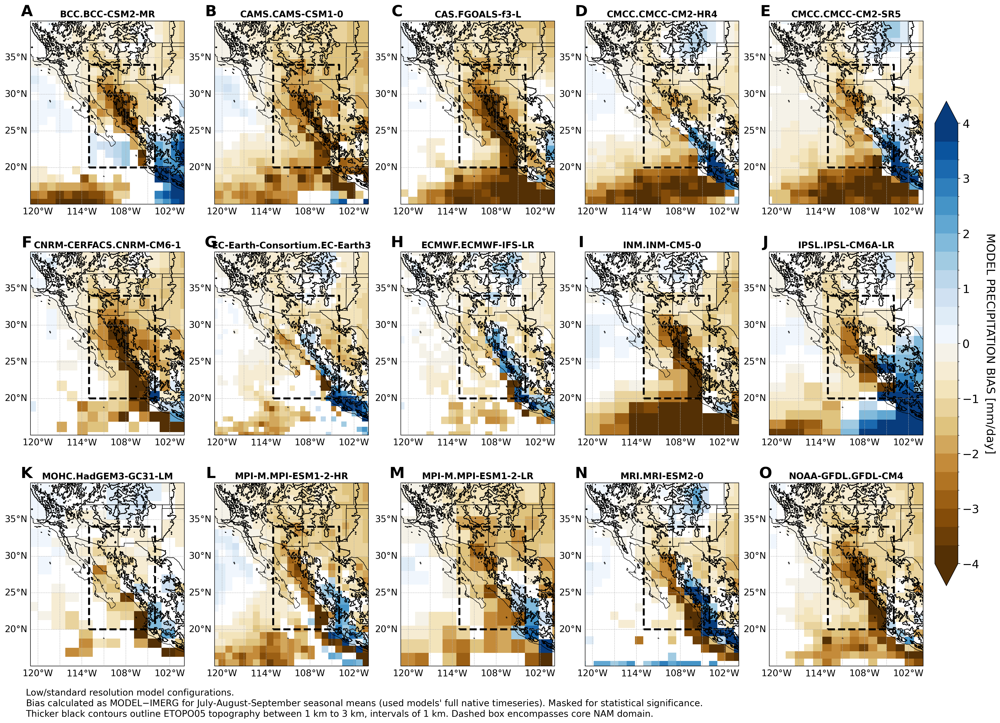

In [201]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
#dcmap=cm.RdBu
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# topography contours
zlevels=np.linspace(1000,3000,3)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(20,15), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.025,-0.02,
         'Low/standard resolution model configurations.\n'
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    if 0 <= i <= 4:
        j=0
        i=i
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    elif 4 < i <= 9:
        j=1
        i=i-5
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    else:
        j=2
        i=i-10
        lons=lowres[key].lon
        lats=lowres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    
for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1.35, colors='k', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=3, linestyle='--', zorder=11) 
    # subplot labels
    ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.75)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.75)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.75)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PRECIPITATION BIAS [mm/day]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

plt.savefig(f'{dpath2}/figs/highresmip_jas_biases_low-res-models.png', transparent=False, bbox_inches='tight')

### High Res Models

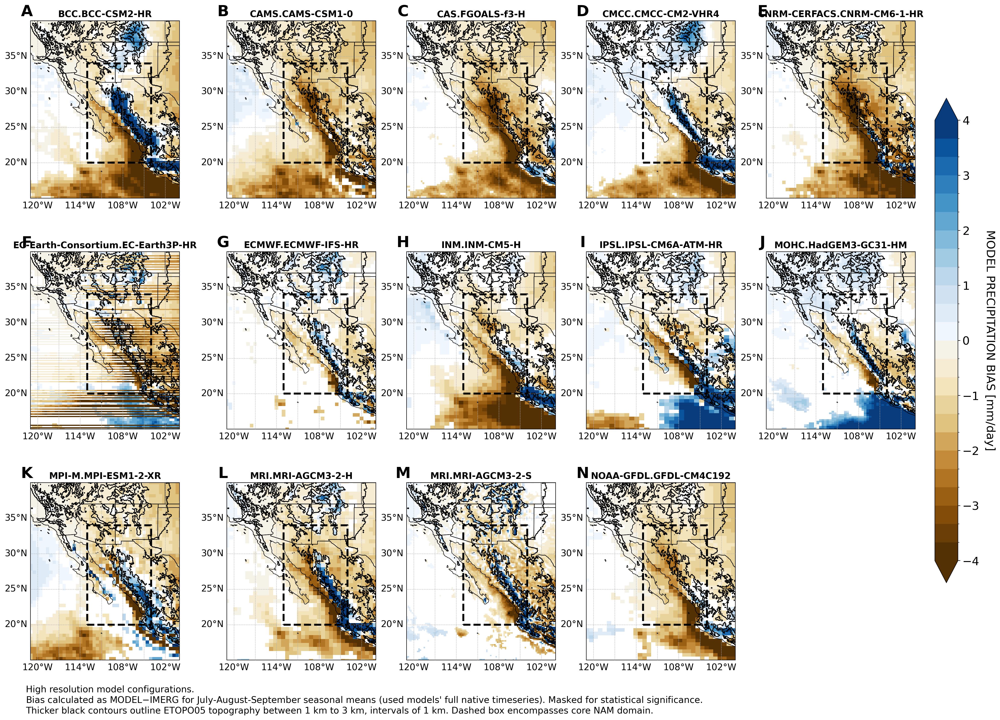

In [20]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':14, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# topography contours
zlevels=np.linspace(1000,3000,3)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=3, ncols=5, figsize=(20,15), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.025,-0.02,
         'High resolution model configurations.\n'
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(highres.keys()):
    if 0 <= i <= 4:
        j=0
        i=i
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    elif 4 < i <= 9:
        j=1
        i=i-5
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)
    else:
        j=2
        i=i-10
        lons=highres[key].lon
        lats=highres[key].lat
        cf=ax[j,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
        ax[j,i].text(tx, ty, key, **text_kw)

ax[2,4].set_visible(False)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1.35, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=3, linestyle='--', zorder=11) 
    # subplot labels
    ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.75)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.75)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.75)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=True)
    gl.bottom_labels=True; gl.left_labels=True; gl.top_labels=False; gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'color': 'black', 'weight': 'normal', 'size':14}
    gl.ylabel_style={'color': 'black', 'weight': 'normal', 'size':14}

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.025, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PRECIPITATION BIAS [mm/day]', labelpad=25, rotation=270, size=18, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=18)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_high-res-models.png', transparent=False, bbox_inches='tight')

### Low vs. High Res Models

In [249]:
del lowres['CMCC.CMCC-CM2-HR4']

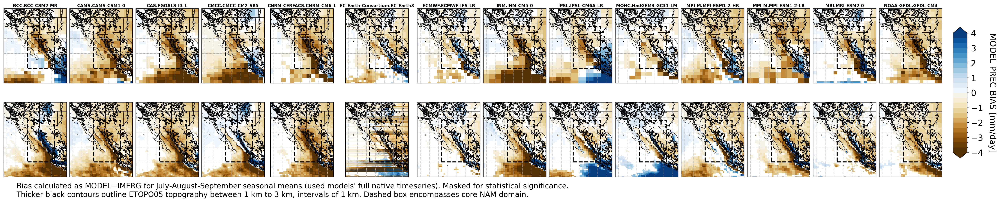

In [257]:
# -------------------- #
#       Settings       #
# -------------------- #
text_kw={'color':'k', 'weight':'bold', 'size':8, 'ha':'center', 'va':'bottom'}
text_kw2={'color':'k', 'weight':'bold', 'size':24, 'ha':'center', 'va':'center'}
text_kw3={'color':'k', 'weight':'normal', 'size':14, 'ha':'left', 'va':'center'}
letters=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P']
tx=-110.5
ty=40.25
# bias colormap
dcmap,_,_,_=get_settings(field='precip', diff=True)
dvmin=-4
dvmax=4
dlevels=np.linspace(dvmin, dvmax, 25)
dnorm=mpl.colors.BoundaryNorm(dlevels, dcmap.N)
# map specs
trans=ccrs.PlateCarree()
proj=ccrs.PlateCarree()
map_bnds=[239,260,15,40]


# ------------------- #
#      Make Plot      #
# ------------------- #
fig, ax = plt.subplots(nrows=2, ncols=14, figsize=(25,5), layout='constrained', subplot_kw={'projection':proj})

fig.text(0.015,-0.02,
         'Bias calculated as MODEL$-$IMERG for July-August-September seasonal means (used models\' full native timeseries). '
         'Masked for statistical significance.\n'
         'Thicker black contours outline ETOPO05 topography between 1 km to 3 km, intervals of 1 km. '
         'Dashed box encompasses core NAM domain.',
         **text_kw3)

for i, key in enumerate(lowres.keys()):
    lons=lowres[key].lon
    lats=lowres[key].lat
    cf=ax[0,i].pcolormesh(lons, lats, obs_diff_mask['lr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    ax[0,i].text(tx, ty, key, **text_kw)

for i, key in enumerate(highres.keys()):
    lons=highres[key].lon
    lats=highres[key].lat
    cf=ax[1,i].pcolormesh(lons, lats, obs_diff_mask['hr'][key], cmap=dcmap, norm=dnorm, transform=trans)
    #ax[1,i].text(tx, ty, key, **text_kw)

for i,ax in enumerate(ax.flat): 
    # add topo contours
    ax.contour(etopoNA.lon, etopoNA.lat, etopoNA, levels=zlevels, linewidths=1, colors='black', transform=trans)
    # add box around core NAM domain
    lon_bnds = np.array([-113, -104, -104, -113])
    lat_bnds = np.array([20,  20,  34,  34])
    ring=LinearRing(list(zip(lon_bnds, lat_bnds)))
    ax.add_geometries([ring], crs=trans, fc='none', ec='k', lw=2, linestyle='--', zorder=11) 
    # subplot labels
    #ax.text(-121.5, ty+1, letters[i], **text_kw2)
    # map properties
    ax.coastlines(color='k', linewidth=.5)
    ax.add_feature(cfeature.STATES, edgecolor='k', linewidth=.5)
    ax.add_feature(cfeature.BORDERS, edgecolor='k', linewidth=.5)
    ax.set_extent(map_bnds, crs=trans)
    gl=ax.gridlines(crs=trans, lw=.5, colors='black', alpha=1.0, linestyle='--', zorder=10, draw_labels=False)
    gl.bottom_labels=False; gl.left_labels=False; gl.top_labels=False; gl.right_labels=False

# colorbar
cax=fig.add_axes([1.01, 0.15, 0.015, 0.7])
cbar=fig.colorbar(cf, ticks=[-4,-3,-2,-1,0,1,2,3,4], orientation='vertical', extend='both', cax=cax)
cbar.set_label('MODEL PREC BIAS [mm/day]', labelpad=25, rotation=270, size=16, fontweight='normal', ha='center')
cbar.ax.tick_params(labelsize=16)
for tick in cbar.ax.yaxis.get_major_ticks():
    tick.label2.set_fontweight('normal')

#plt.savefig(f'{dpath2}/figs/highresmip_jas_pr_biases_high-res-models.png', transparent=False, bbox_inches='tight')

## Line Plot

In [21]:
# delete CMCC because there's two low res versions
del lowres['CMCC.CMCC-CM2-HR4']
# delete EC Earth3 because the HR data is corrupted
del lowres['EC-Earth-Consortium.EC-Earth3']
del highres['EC-Earth-Consortium.EC-Earth3P-HR']

In [80]:
#=== create combined dictionary

# init dict
allmodels = {}

# set lat/lon bounds
ymin=24
ymax=30
xmin=245
xmax=260


allmodels.update({
    key: obs_diff['lr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
    for key in lowres.keys()
}

allmodels.update({
    key: obs_diff['hr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
    for key in highres.keys()
})
    
# sort models from coarsest to finest
sorted_models = dict(
    sorted(
        allmodels.items(),
        key=lambda item: len(item[1].coords["lon"])
    )
)

In [147]:


# Example: define diagonal transect from NW (ymax, xmin) to SE (ymin, xmax)
npoints = 200  # resolution along the transect
lats = np.linspace(30, 22, npoints)
lons = np.linspace(246, 257, npoints)

# Extract the DataArray
for key in allmodels.keys():
    da = allmodels[key]
    
    # Create interpolator (requires lat/lon to be sorted ascending)
    lat_vals = da['lat'].values
    lon_vals = da['lon'].values
    data_vals = da.values

    # Ensure lat is ascending (common with climate data lat is descending!)
    if lat_vals[0] > lat_vals[-1]:
        lat_vals = lat_vals[::-1]
        data_vals = data_vals[::-1, :]

    interp = RegularGridInterpolator(
        (lat_vals, lon_vals),
        data_vals,
        bounds_error=False,
        fill_value=np.nan
    )

    # Interpolate along diagonal
    points = np.array([lats, lons]).T
    transect_vals = interp(points)

In [154]:
np.size(points)

400

In [ ]:
"""
allmodels = {
    **{key: obs_diff['lr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
       for key in lowres.keys()},
    **{key: obs_diff['hr'][key].sel(lat=slice(ymin,ymax), lon=slice(xmin,xmax)).load()
       for key in highres.keys()}
}
"""

In [78]:
"""
# calculate mean meridional bias between 25°N to 30°N
# set lat/lon bounds
ymin=26.5
ymax=27.5
xmin=249.5
xmax=255

lr_bias_profile = collections.defaultdict(dict) # initialize dict

lr_bias_profile = {
    key: obs_diff['lr'][key]
        .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
        .mean(dim="lat", skipna=True)
        .load()
    for key in lowres.keys()
}

hr_bias_profile = collections.defaultdict(dict) # initialize dict

hr_bias_profile = {
    key: obs_diff['hr'][key]
        .sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax))
        .mean(dim="lat", skipna=True)
        .load()
    for key in highres.keys()
}
"""

In [87]:
etopo_profile=etopoNA.sel(lat=slice(ymin, ymax), lon=slice(xmin, xmax)).mean(dim="lat", skipna=True)

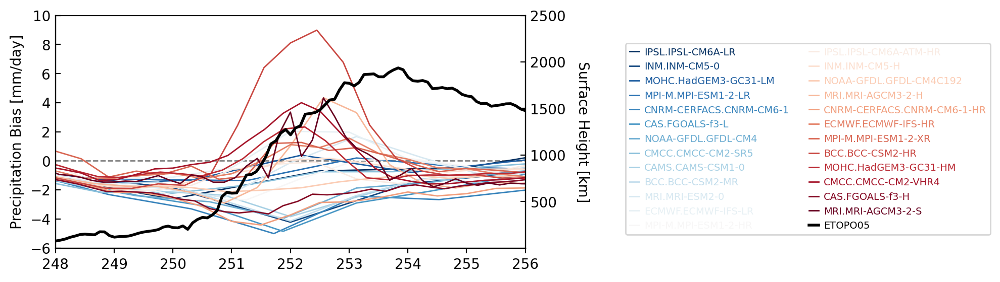

In [143]:
#legend_kw = {'loc':1, 'fontsize':8, 'labelcolor':'linecolor','frameon':False}
legend_kw = {'loc':'upper right', 'bbox_to_anchor':(2, .9), 'ncol':2,
             'fontsize':7, 'labelcolor':'linecolor', 'frameon':True, 'handlelength':1, 'handletextpad':0.5}
text_kw={'size': 'medium', 'weight': 'bold', 'color': 'k'}
line_kw={'ls':'-', 'lw':1}
eline_kw={'ls':'-', 'lw':2} #, 'marker':'s', 'mec':'k', 'mew':0.25} 
tkw = {'axis': 'y', 'direction':'in', 'labelsize': 10} 
# var specs
prof_min=26
prof_max=28
lons = etopo_profile.lon
allcmap = cm.RdBu_r
norm = mpl.colors.Normalize(vmin=0, vmax=len(allmodels)-1)

# initialize figure
fig = plt.figure(figsize=(6, 3))

# plot model-obs biases
ax1 = plt.subplot(111)
ax1.axhline(y=0, color='gray', linewidth=1, linestyle='--', label='_Hidden') # plot 0 line
for i, key in enumerate(sorted_models.keys()):
    color = allcmap(norm(i))
    ax1.plot(sorted_models[key].lon, sorted_models[key].sel(lat=slice(prof_min,prof_max)).mean(dim='lat'),
             c=color, label=key, **line_kw) 
ax1.set(ylim=[-6,10],
        yticks=[-6,-4,-2,0,2,4,6,8,10])
ax1.set_ylabel('Precipitation Bias [mm/day]', color='k')
ax1.tick_params(color='k', labelcolor='k', **tkw)



# instantiate a second axes that shares the same x-axis
ax2 = ax1.twinx() 
# plot etopo surface height data
ax2.plot(lons, etopo_profile, c='k', label='ETOPO05', **eline_kw) 
ax2.set(ylim=[0, 2500],
        yticks=[500,1000,1500,2000,2500])
ax2.set_ylabel('Surface Height [km]', color='k', rotation=270, labelpad=17)
ax2.tick_params(color='k', labelcolor='k', **tkw)

# plot formatting
ax1.spines['left'].set_color('black')
ax1.spines['top'].set_color('black')
ax2.spines['top'].set_color('none')
ax2.spines['left'].set_color('black')
ax2.spines['right'].set_color('black')

plt.xlim([248,256])

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, **legend_kw)

## Export info about mean NAM bias and model resolution

In [169]:
#=== low res

# define lat/lon bounds of NAM region
lat_min = 20
lat_max = 34
lon_min = 247
lon_max = 256

#=== Get info about low res models

# initialize arrays
instIDs  = []
modelIDs = []
nam_bias = []
xres     = []
yres     = []

for key in lowres.keys():
    
    # divide the model keys to create lists for the first two columns of data.
    instID, modelID, = key.split(sep='.')
    instIDs.append(instID)
    modelIDs.append(modelID)

    # calculate mean jas precip bias within nam region
    bias = obs_diff['lr'][key].sel(lon=slice(lon_min,lon_max), lat=slice(lat_min,lat_max)).values
    nam_bias.append(np.mean(bias))

    # get info about model resolution
    xlen = lowres[key].lon.shape[0]
    ylen = lowres[key].lat.shape[0]
    xres.append(xlen)
    yres.append(ylen)
                    
# store all info into an array
lowres_biases = np.array([instIDs, modelIDs, xres, yres, nam_bias])

                    
                    
#=== Repeat for high res models
                    
# initialize arrays
instIDs  = []
modelIDs = []
nam_bias = []
xres     = []
yres     = []

for key in highres.keys():
    
    # divide the model keys to create lists for the first two columns of data.
    instID, modelID, = key.split(sep='.')
    instIDs.append(instID)
    modelIDs.append(modelID)

    # calculate mean jas precip bias within nam region
    bias = obs_diff['hr'][key].sel(lon=slice(lon_min,lon_max), lat=slice(lat_min,lat_max)).values
    nam_bias.append(np.mean(bias))

    # get info about model resolution
    xlen = highres[key].lon.shape[0]
    ylen = highres[key].lat.shape[0]
    xres.append(xlen)
    yres.append(ylen)
                    
# store all info into an array
highres_biases = np.array([instIDs, modelIDs, xres, yres, nam_bias])


In [170]:
# export to csv
np.savetxt(fname='hrmip.nam.bias.lr.csv', delimiter=',',X=lowres_biases, fmt='%s')
np.savetxt(fname='hrmip.nam.bias.hr.csv', delimiter=',',X=highres_biases, fmt='%s')